In [1]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
#importing required packages
from bs4 import BeautifulSoup
import os
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import rasterio
import numpy as np
from rasterio import plot
import math
from datetime import datetime

#machine learning packages 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from scipy.stats import pearsonr

#plotting packages
from matplotlib.colors import ListedColormap
from matplotlib import cm
from matplotlib.colors import BoundaryNorm
import matplotlib as mpl
import matplotlib.pylab as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from matplotlib import patches



In [3]:
from rasterio import mask
import rasterio

In [4]:
os.chdir('../')

In [5]:
#importing other python files 
import src.Tide_API as tide
import src.Depth_profile as depth
import src.Pixel_transformation as pt
import src.Sentinel2_image as s2

In [6]:
import src.Coral_Reef as coral_reef

In [96]:
reef = coral_reef.Coral_Reef('data', 'Great_Blue_Hole')
coords = reef.get_bounding_box()

In [97]:
coords

(-87.63201713562012, 17.12602649766456, -87.45245933532715, 17.471601874365017)

In [98]:
s = s2.Sentinel2_image('data/Great_Blue_Hole/S2A_MSIL2A_20190412T160901_N0211_R140_T16QDE_20190412T203432.SAFE', coords)

In [87]:
imgs = s.load_sentinel()

In [100]:
s.read_gjson()['geometry']

0    LINESTRING (443958.3101889456 1901828.84398765...
Name: geometry, dtype: object

In [63]:
np.percentile(imgs[3],30)

1.0

<IPython.core.display.Javascript object>


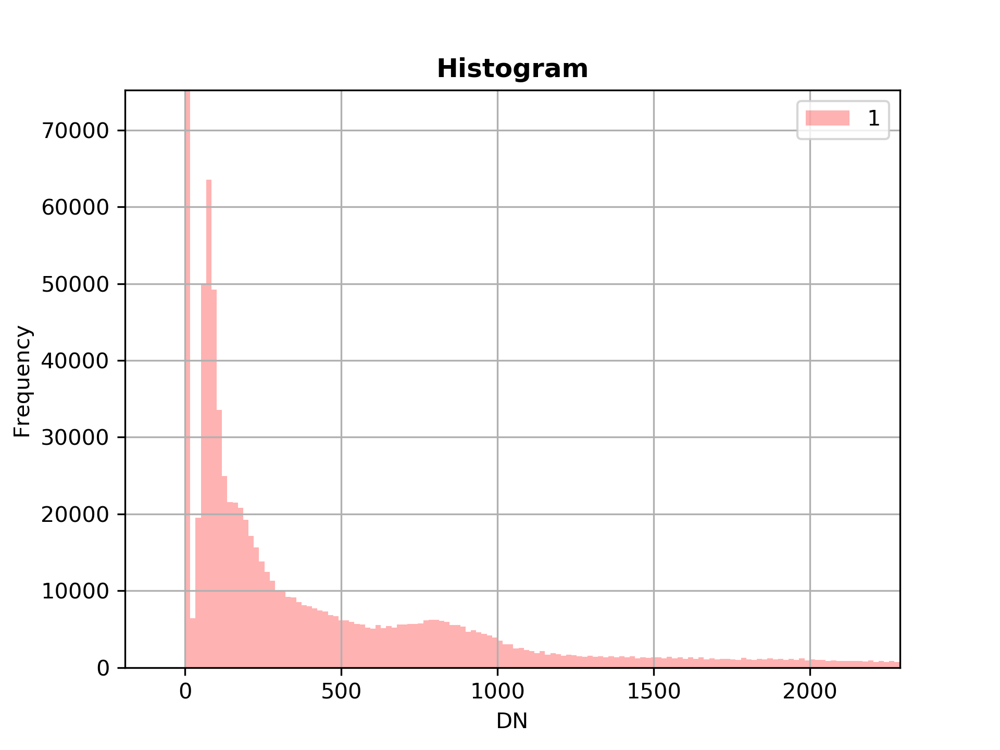

In [64]:
plot.show_hist(imgs[2], bins=500, stacked=False, alpha=0.3,  title="Histogram")

In [23]:
moce = pd.read_csv('data/Moce/Output/Moce.csv')

In [28]:
master_df = moce.drop(['x','y','median','mean','range','Unnamed: 0'], axis = 1)

In [39]:
master_df

,2019/04/01,2019/08/09,2019/10/18,2019/11/27,2020/02/05,2019/01/26,2019/03/07,2019/03/17,2019/06/15,2019/07/15,2020/01/21
0,-10.893157,-8.580953,-7.486335,-6.345941,-5.460951,-11.857958,NaN,-10.196348,-107.482611,-16.228309,-10.590578
1,-8.704256,-15.251840,-5.249879,-8.955930,-4.605042,-11.351019,NaN,-11.141328,-105.317177,-75.220175,-11.177841
2,-9.200368,-91.215346,-6.490309,-8.040917,-5.426628,-10.828627,NaN,-8.516492,-105.575614,-75.741821,-8.504499
3,-10.134875,-91.556150,-4.618897,-6.786405,-6.094584,-15.456118,NaN,-10.694449,-22.901423,-16.443984,-9.737623
4,-10.081955,-7.105876,-4.743016,-7.071485,-8.023349,-13.459623,NaN,-9.774854,-27.739876,-14.684865,-11.657409
5,-8.867110,-9.854290,-6.944581,-8.112652,-7.862596,-32.353081,NaN,-8.633218,-23.733410,-12.720474,-10.379469
6,-8.906153,-9.677451,-6.465379,-10.457033,-7.133051,-89.553713,NaN,-9.135448,-29.986088,-18.130310,-9.830533
7,-9.457384,-6.501701,-4.576410,-10.051464,-7.545639,-12.170234,NaN,-11.546441,-107.602714,-76.947779,-10.408944
8,-10.610763,-7.751956,-5.446101,-6.997525,-7.116527,-88.486816,NaN,-9.609106,-107.996454,-17.415064,-9.158737
9,-10.265924,-8.584045,-7.689323,-6.909744,-6.453467,-10.043309,NaN,-8.978305,-107.409558,-15.300155,-10.032928


In [41]:
master_df.apply(lambda x: np.median(x.dropna()) if len(x.dropna()) > 8 else np.nan, axis = 1)

0        -10.393463
1        -11.159585
2         -8.858430
3        -10.414662
4         -9.928404
5         -9.360700
6         -9.753992
7        -10.230204
8         -9.383922
9         -9.505616
10        -9.282882
11        -9.493222
12       -10.580829
13        -9.663855
14       -11.056550
15        -8.856851
16        -9.086557
17        -9.058890
18        -8.893030
19        -9.068038
20        -9.479626
21        -9.125220
22       -10.861289
23       -10.099713
24        -9.486859
25       -10.016140
26       -10.598228
27       -10.362731
28        -8.786404
29        -8.715435
            ...    
607078    -0.990208
607079    -0.065370
607080     0.385459
607081    -1.017136
607082    -0.158367
607083     0.843924
607084     1.279286
607085    -0.074003
607086     0.005428
607087     0.864434
607088     0.929919
607089     0.728274
607090    -0.486538
607091    -0.390419
607092    -2.042237
607093    -1.944290
607094    -1.602831
607095    -1.380911
607096    -1.941888


In [38]:
master_df.median(axis = 1)

0        -10.393463
1        -11.159585
2         -8.858430
3        -10.414662
4         -9.928404
5         -9.360700
6         -9.753992
7        -10.230204
8         -9.383922
9         -9.505616
10        -9.282882
11        -9.493222
12       -10.580829
13        -9.663855
14       -11.056550
15        -8.856851
16        -9.086557
17        -9.058890
18        -8.893030
19        -9.068038
20        -9.479626
21        -9.125220
22       -10.861289
23       -10.099713
24        -9.486859
25       -10.016140
26       -10.598228
27       -10.362731
28        -8.786404
29        -8.715435
            ...    
607078    -0.990208
607079    -0.065370
607080     0.385459
607081    -1.017136
607082    -0.158367
607083     0.843924
607084     1.279286
607085    -0.074003
607086     0.005428
607087     0.864434
607088     0.929919
607089     0.728274
607090    -0.486538
607091    -0.390419
607092    -2.042237
607093    -1.944290
607094    -1.602831
607095    -1.380911
607096    -1.941888


In [14]:
s.get_meta()

{'dt': datetime.datetime(2019, 7, 15, 22, 11, 15),
 'crs': 'epsg:32701',
 'xdim': 10,
 'ydim': -10,
 'ulx': 337803.4093075963,
 'uly': 7940133.253426169,
 'imgs': [array([[[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16),
  array([[[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16),
  array([[[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16),
  array([[[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
       

In [65]:
r,m,d = pt.get_regressor(reef,s)

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


mse train  0.008987209262416923
mse test  0.007497355250787968


In [67]:
d

,x,y,b2,b3,diff,Height
1,322296.614373,7.711544e+06,338,633,-0.627425,-1.497749
2,322301.521103,7.711600e+06,611,984,-0.476529,-1.416083
3,322306.427881,7.711655e+06,685,1081,-0.456223,-1.130487
4,322311.334710,7.711711e+06,854,1267,-0.394476,-1.136768
5,322316.241587,7.711766e+06,1008,1299,-0.253627,-1.716295
6,322321.148514,7.711822e+06,1417,1577,-0.106982,-1.901414
7,322326.055491,7.711877e+06,2001,2051,-0.024680,-2.195408
8,322330.962516,7.711932e+06,2311,2243,0.029866,-2.364129
9,322335.869591,7.711988e+06,2281,2193,0.039343,-2.422523
10,322340.776716,7.712043e+06,2137,2053,0.040101,-2.562091


In [19]:
import math

In [68]:
x = d.loc[:,['Height']]
y = d.loc[:,['diff']]


<IPython.core.display.Javascript object>


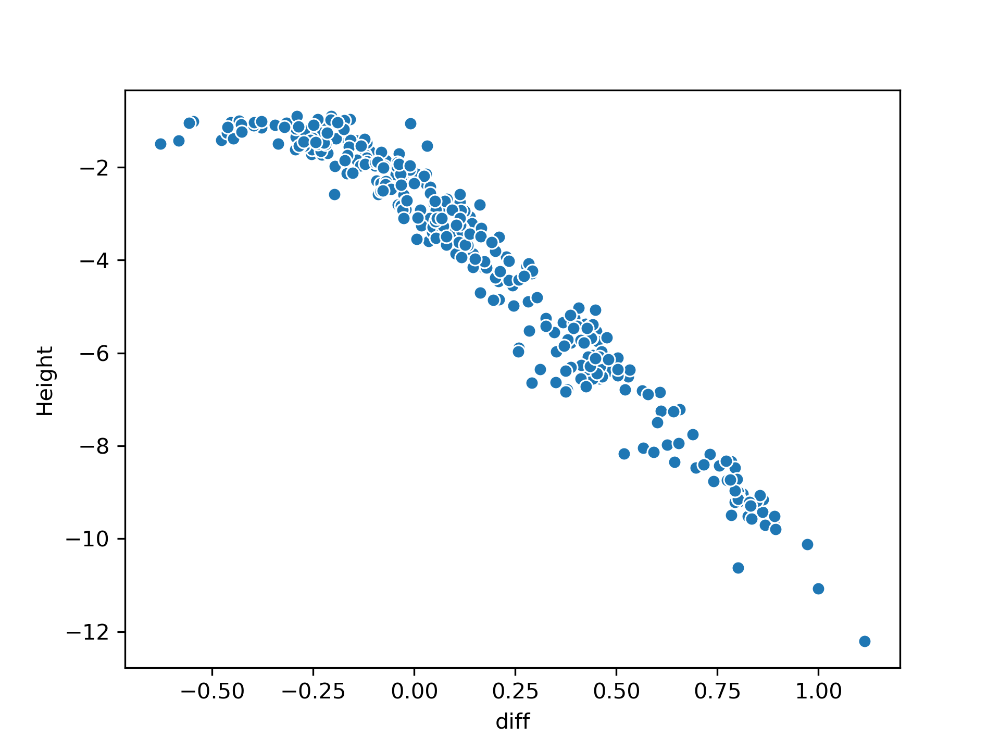

In [69]:
fig, ax = plt.subplots()
sns.scatterplot(y = x['Height'], x = y['diff'])

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 22/1099 [00:00<00:04, 216.37it/s]

mse train  0.008987209262416923
mse test  0.007497355250787968
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 55.89it/s] 


<IPython.core.display.Javascript object>


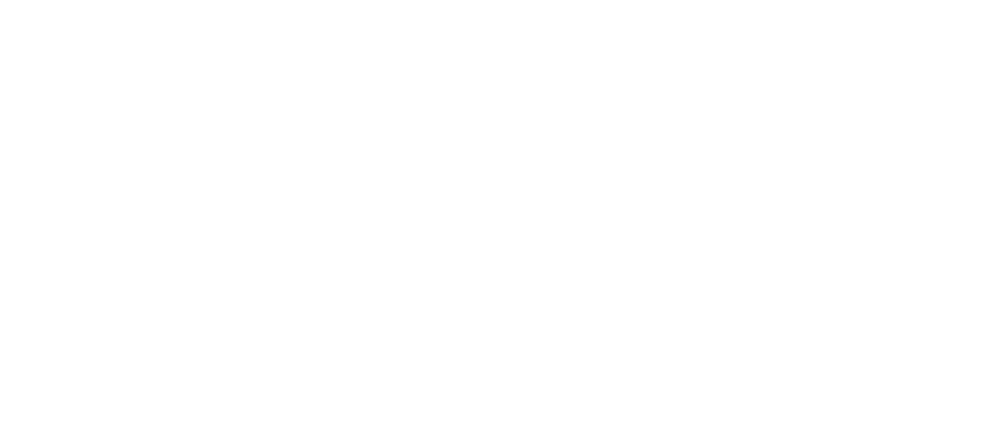

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 247.85it/s]

mse train  0.005703161560867274
mse test  0.005945028366901068
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 55.02it/s] 


<IPython.core.display.Javascript object>


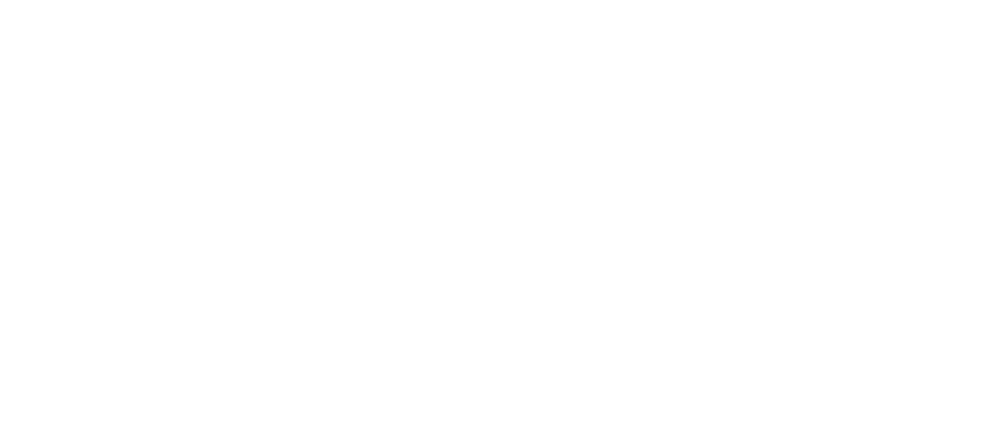

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


mse train  1.3379482095445887
mse test  4.391489542040301


/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 25/1099 [00:00<00:04, 242.93it/s]

mse train  0.004544275459316411
mse test  0.005476177002833059
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 55.60it/s]


<IPython.core.display.Javascript object>


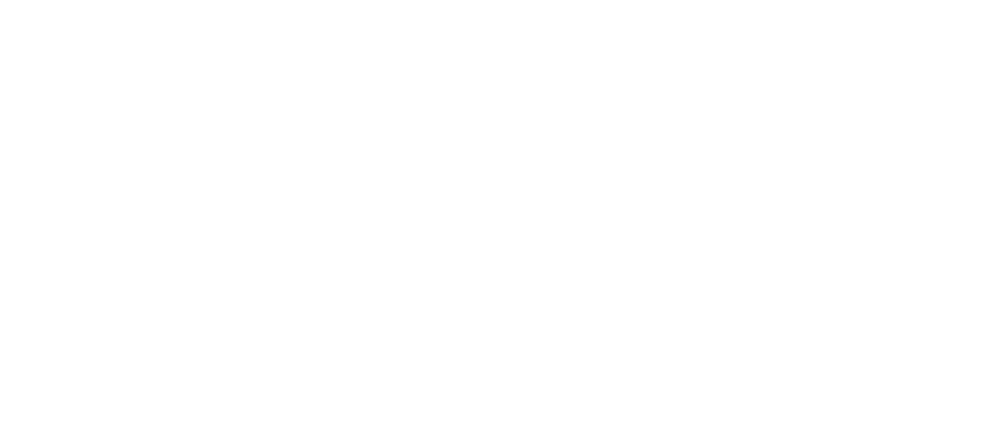

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 247.19it/s]

mse train  0.00481047378048212
mse test  0.00442852026466532
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 56.20it/s]


<IPython.core.display.Javascript object>


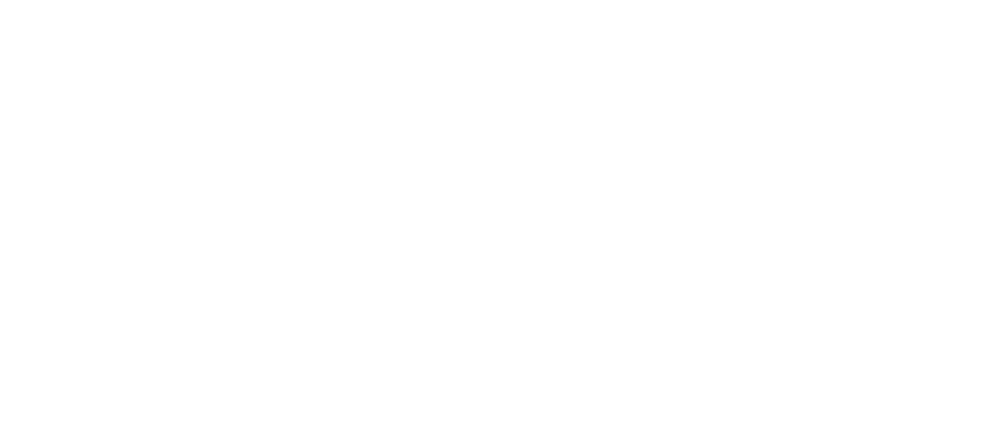

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 252.51it/s]

mse train  0.006018196463229486
mse test  0.008683583399477942
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 56.93it/s] 


<IPython.core.display.Javascript object>


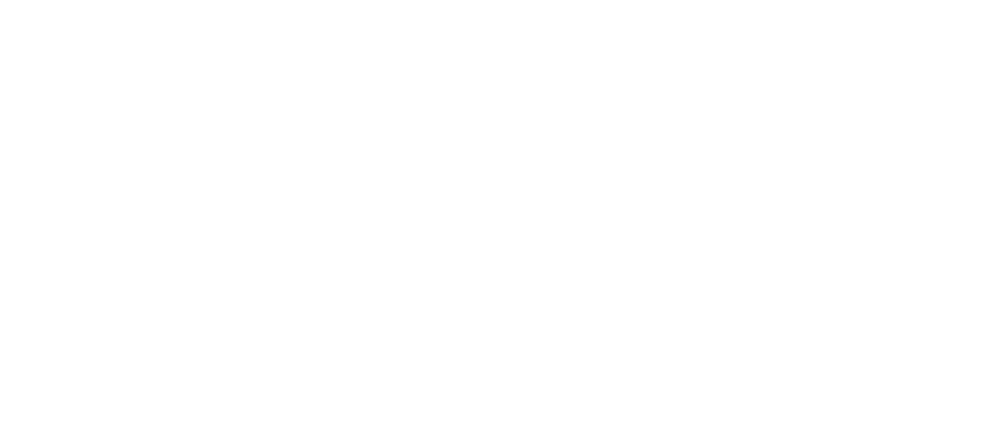

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 254.56it/s]

mse train  0.005187383540138582
mse test  0.010917661024308689
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 56.55it/s]


<IPython.core.display.Javascript object>


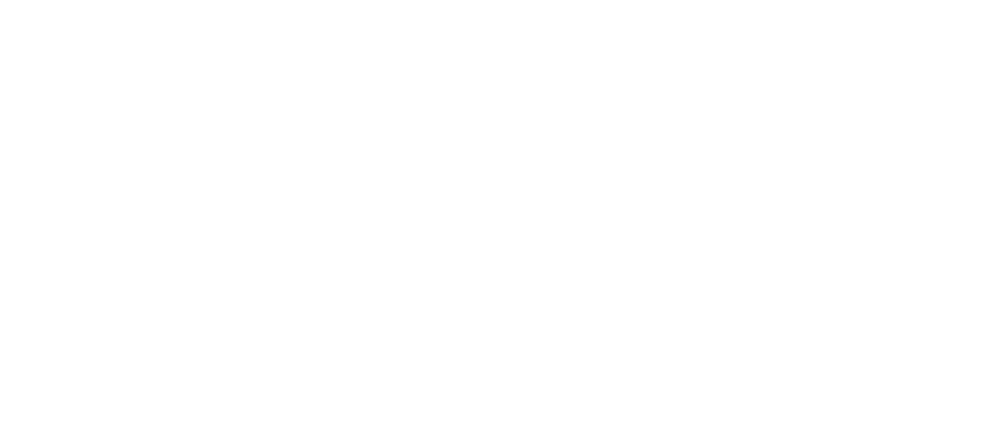

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 24/1099 [00:00<00:04, 230.12it/s]

mse train  0.007412497128591339
mse test  0.005401202838162427
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:20<00:00, 54.89it/s] 


<IPython.core.display.Javascript object>


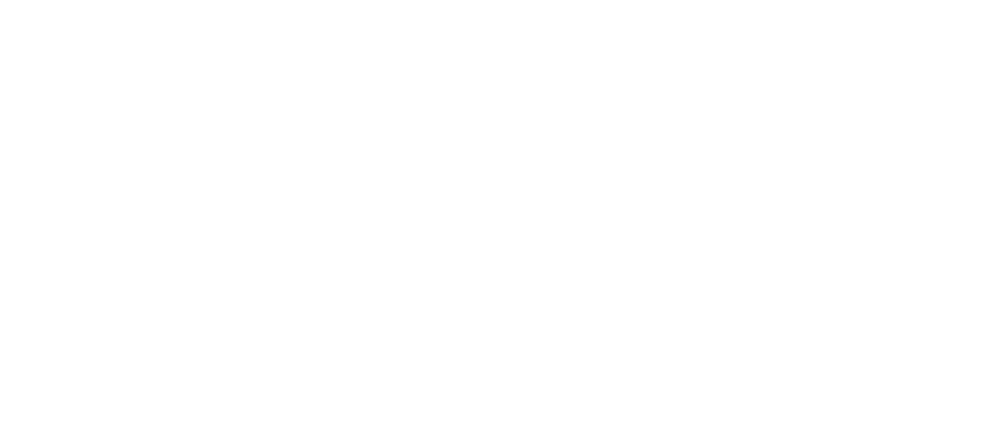

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 255.87it/s]

mse train  0.004591573174082016
mse test  0.004998295949818936
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 55.51it/s]


<IPython.core.display.Javascript object>


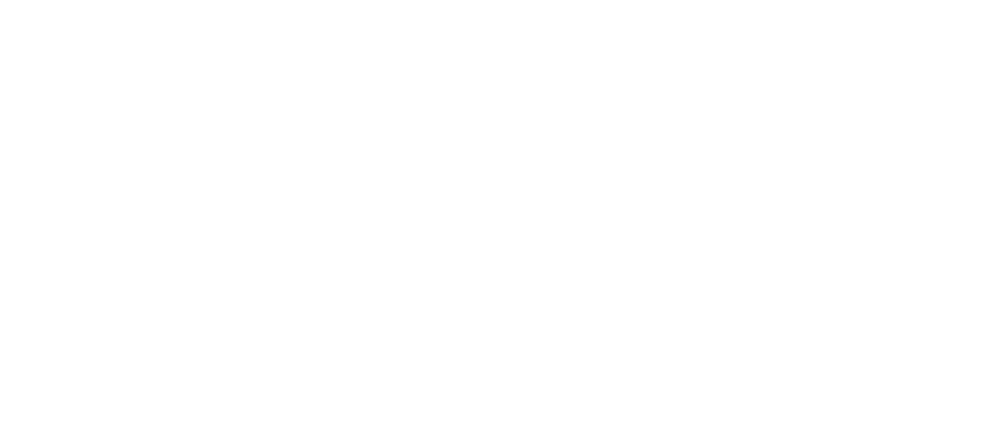

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 259.69it/s]

mse train  0.003252541801793468
mse test  0.003159087018278997
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:19<00:00, 56.43it/s]


<IPython.core.display.Javascript object>


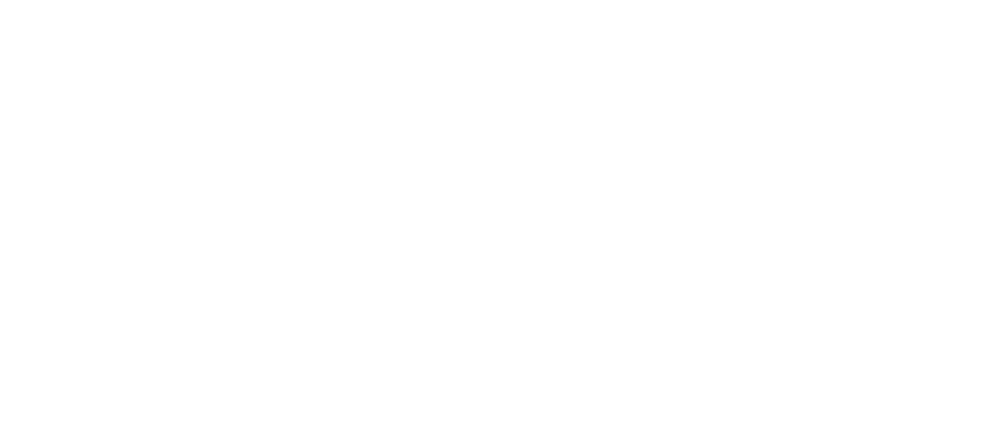

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 24/1099 [00:00<00:04, 236.36it/s]

mse train  0.005113856335490494
mse test  0.004890674198659904
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:20<00:00, 53.36it/s]


<IPython.core.display.Javascript object>


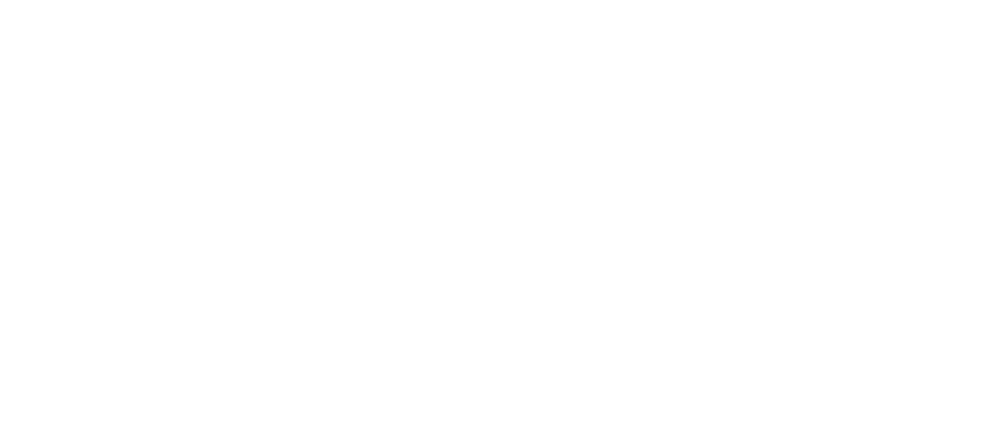

/Users/ksunil/Desktop/Karan/Codebase/src/Pixel_transformation.py:40: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  df = pd.DataFrame.from_csv(fp)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
  2%|▏         | 26/1099 [00:00<00:04, 251.30it/s]

mse train  0.006017882750108502
mse test  0.004623865382992215
(1, 1099, 1034) (1, 1099, 1034) (1, 1099, 1034)


100%|██████████| 1099/1099 [00:20<00:00, 54.46it/s]


<IPython.core.display.Javascript object>


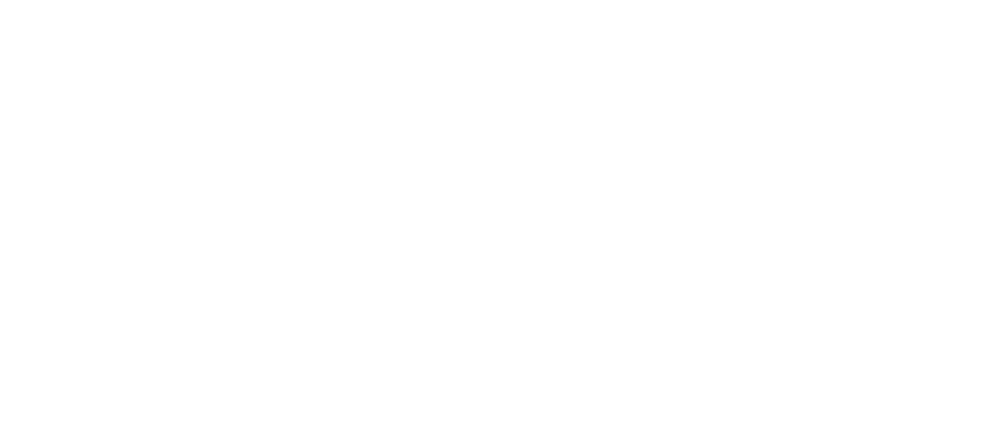

/Users/ksunil/Desktop/Karan/Codebase/src/Reef_plots.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['Height'] = df['median']


<IPython.core.display.Javascript object>


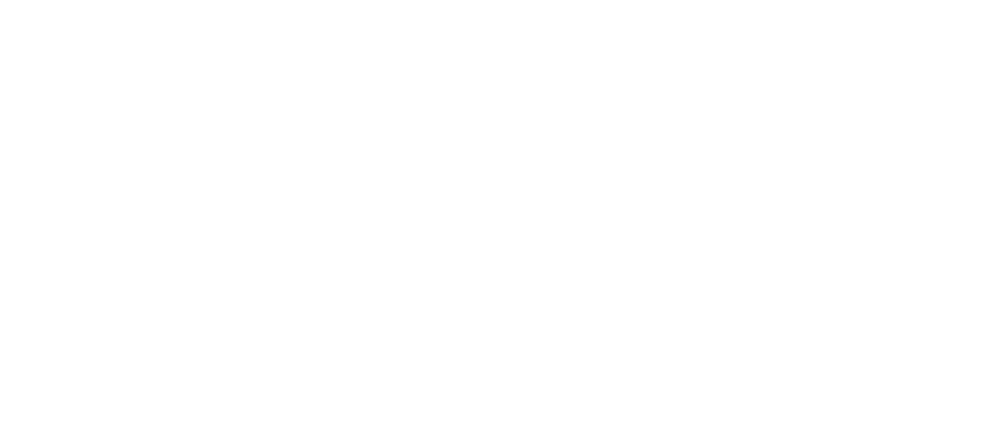

<IPython.core.display.Javascript object>


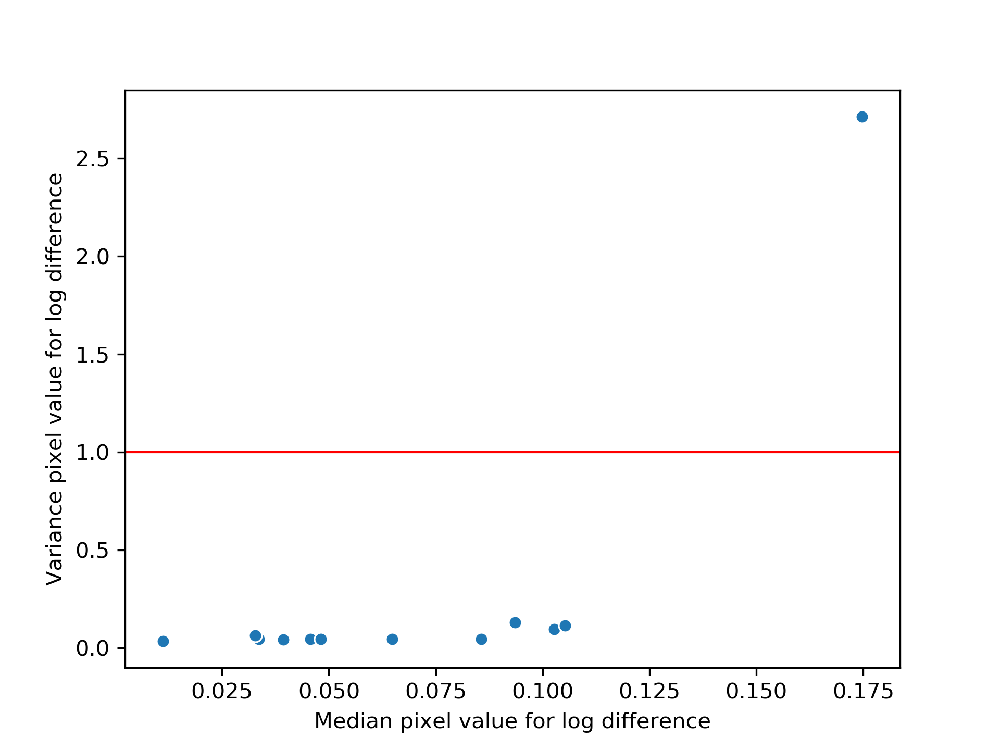

<IPython.core.display.Javascript object>


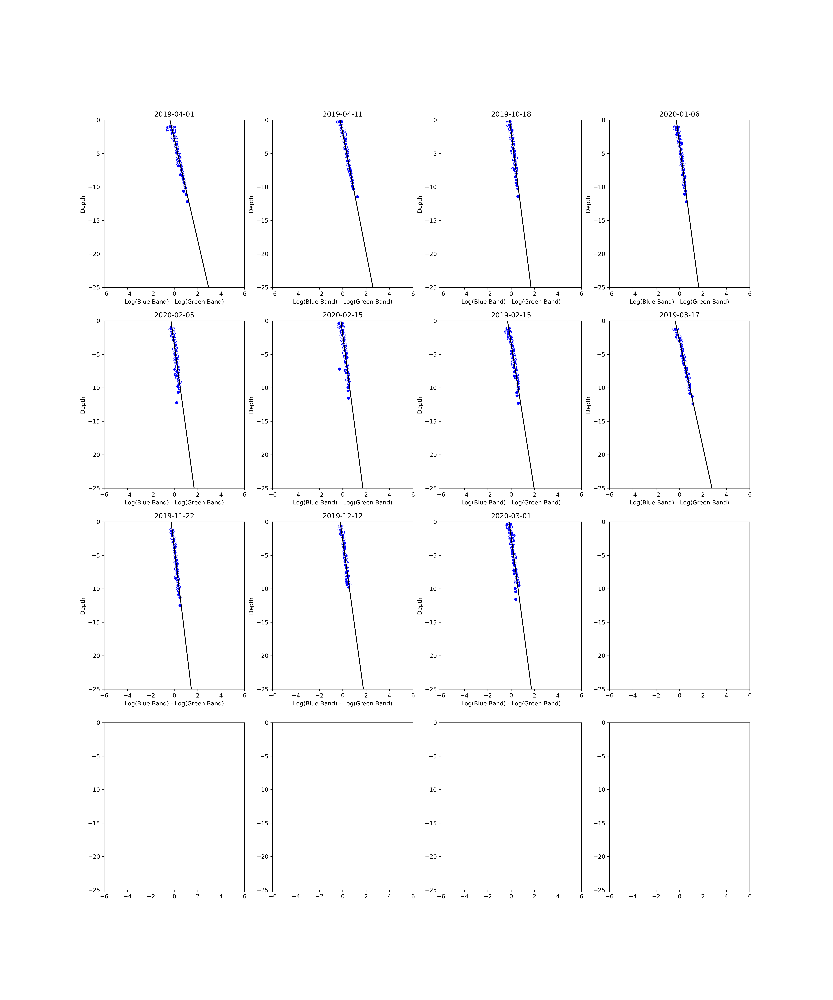

In [72]:
datum = pt.all_safe_files(reef)

In [39]:
import glob
from pathlib import Path
from matplotlib import 
os.getcwd()

'/Users/ksunil/Desktop/Karan/Codebase/notebooks'

In [17]:
import statsmodels.api as sm 
import pylab as py 

In [6]:
moce_train = os.path.join('data','Moce','Training_data')

In [11]:
def linear_relationship(data):
    return data['Height'].corr(data['diff'])

In [14]:
def multivariate_normal(data):
    sm.qqplot(data[['Height','diff']], line ='45') 
    py.show() 

In [ ]:
for fn in os.listdir(moce_train):
    df = pd.read_csv(moce_train + '/' + fn)
    print(linear_relationship(df))
    multivariate_normal(df)

In [19]:
data_points = np.random.normal(0, 1, 100)  

In [21]:
df

,Unnamed: 0,Height,diff,b2,b3,x,y
0,0,-8.739236,0.212561,47.0,38.0,344881.307416,7.926918e+06
1,1,-8.739236,0.450201,80.0,51.0,344886.342589,7.926973e+06
2,2,-7.241689,0.067252,123.0,115.0,344891.377805,7.927029e+06
3,3,-2.760444,-0.312683,158.0,216.0,344896.413065,7.927084e+06
4,4,-1.837878,-0.358634,153.0,219.0,344901.448369,7.927140e+06
5,5,-1.637805,-0.423814,180.0,275.0,344906.483717,7.927195e+06
6,6,-1.332110,-0.639443,153.0,290.0,344911.519110,7.927250e+06
7,7,-2.105018,-0.188197,198.0,239.0,344916.554546,7.927306e+06
8,8,-1.524508,-0.453256,143.0,225.0,344921.590026,7.927361e+06
9,9,-1.869435,-0.487191,137.0,223.0,344926.625550,7.927417e+06
